<a href="https://www.kaggle.com/code/dalloliogm/eda-plotting-cell-distribution-by-slice?scriptVersionId=229650812" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# EDA: Cell Distribution

This notebook shows the distribution of abundance for each of the 35 cells, on the slice. 

Why this is useful: 
- Some cell types may tend to cluster together. They could be similar cell types, or cells that interact with each other for some biological reason
- Some spots may have a low number of cells


In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import math

def plot_celltype_abundance(slide_name, image, spots, plots_per_line=4, show_image=False):
    """
    Plot the slide image with spot overlays for cell-type abundances (C1 to C35).

    Parameters:
        slide_name (str): Name of the slide.
        image (np.array): 2D or 3D array representing the slide image.
        spots (np.array): Structured NumPy array containing spot information with fields:
                          'x', 'y', 'C1', 'C2', ..., 'C35'.
        plots_per_line (int): Number of subplots per row (default is 4).

    The function creates a figure with subplots arranged in a grid and plots:
      - The slide image as a background.
      - A scatter overlay at spot (x, y) positions, colored by the abundance of each cell type.
      - A common colorbar that indicates the mapping from color to abundance.
    """
    # Extract the x and y coordinates from the spots array
    x = spots["x"]
    y = spots["y"]
    num_celltypes = 35  # There are 35 cell types (C1 to C35)
    num_rows = math.ceil(num_celltypes / plots_per_line)
    
    # Create a figure with a grid of subplots
    fig, axes = plt.subplots(num_rows, plots_per_line, figsize=(plots_per_line * 3, num_rows * 3))
    axes = axes.flatten()  # Flatten to simplify indexing
    
    # Loop over each cell type field from C1 to C35
    for i in range(num_celltypes):
        var_name = f"C{i+1}"  # Create field name e.g. "C1", "C2", ...
        c_values = spots[var_name]  # Get the abundance values for this cell type
        
        ax = axes[i]
        if show_image is True:
            ax.imshow(image, aspect="auto")
        else:
            # Manually set the axis limits to match the image dimensions
            height, width = image.shape[:2]
            ax.set_xlim(0, width)
            ax.set_ylim(height, 0)  # invert y-axis to mimic image display

        sc = ax.scatter(x, y, c=c_values, cmap="viridis", s=2, alpha=1)
        #sc = ax.scatter(x, y, c=c_values, cmap="plasma", s=2, alpha=0.7)

        ax.set_title(var_name, fontsize=8)
        ax.axis("off")
    
    # If there are any extra subplots (in case grid has one more cell), hide them
    for j in range(num_celltypes, len(axes)):
        axes[j].axis("off")
    
    # Set an overall title for the figure
    fig.suptitle(f"Slide {slide_name}", fontsize=14)
    
    # Add a common colorbar (using the last scatter object)
    #fig.colorbar(sc, ax=axes.tolist(), label="Abundance")
    #fig.subplots_adjust(right=0.85)
    #cbar_ax = fig.add_axes([0.88, 0.15, 0.03, 0.7])  # [left, bottom, width, height]
    #fig.colorbar(sc, cax=cbar_ax, label="Abundance")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


def plot_total_abundance(slide_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=True):
    """
    Plot the slide image with spot overlays where each spot's color represents 
    the total abundance of cell types C1 to C35.

    Parameters:
        slide_name (str): Name of the slide.
        image (np.array): The slide image.
        spots (np.array): Structured NumPy array with fields 'x', 'y', and 'C1' ... 'C35'.
        show_colorbar (bool): Whether to display a colorbar (default True).
        colorbar_outside (bool): If True, place the colorbar to the right of the plot.
    """
    # Extract x and y coordinates from the spots array
    x = spots["x"]
    y = spots["y"]
    
    # Compute total abundance by summing C1 through C35 for each spot
    total_abundance = np.zeros_like(x, dtype=float)
    for i in range(1, 36):  # Fields C1 to C35
        total_abundance += spots[f"C{i}"]
    
    # Create a figure
    fig, ax = plt.subplots(figsize=(6, 6))
    if show_image is True:
        ax.imshow(image, aspect="auto")
    else:
        # Manually set the axis limits to match the image dimensions
        height, width = image.shape[:2]
        ax.set_xlim(0, width)
        ax.set_ylim(height, 0)  # invert y-axis to mimic image display

    sc = ax.scatter(x, y, c=total_abundance, cmap="viridis", s=2, alpha=0.7)
    ax.set_title(f"Total Abundance for Slide {slide_name}")
    ax.axis("off")
    
    # Add a colorbar if desired
    if show_colorbar:
        if colorbar_outside:
            # Adjust the right margin to make room for the colorbar
            fig.subplots_adjust(right=0.85)
            cbar_ax = fig.add_axes([0.88, 0.15, 0.03, 0.7])
            fig.colorbar(sc, cax=cbar_ax, label="Total Abundance")
        else:
            fig.colorbar(sc, ax=ax, label="Total Abundance")
    
    plt.tight_layout()
    plt.show()



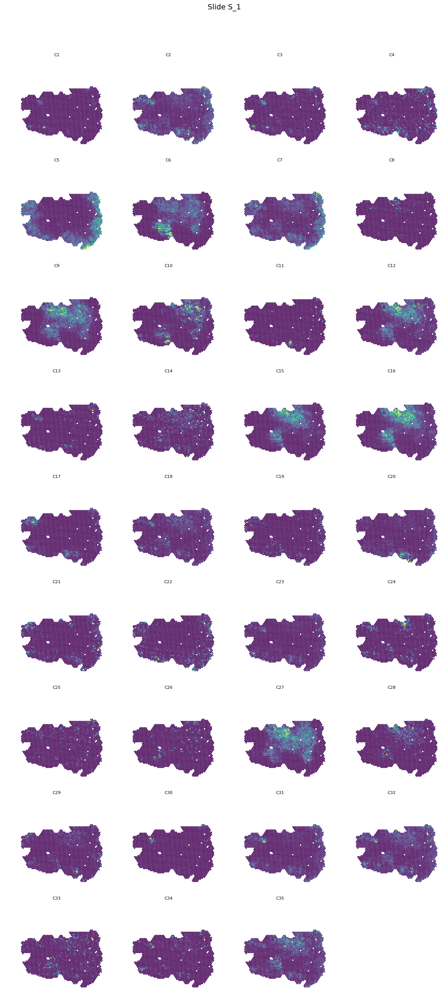

In [2]:
slice_name = "S_1"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_celltype_abundance(slice_name, image, spots, plots_per_line=4)

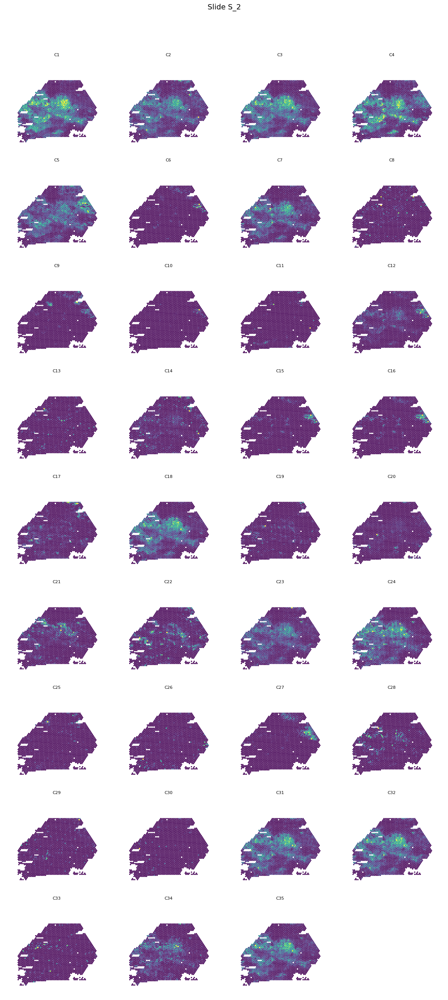

In [3]:
slice_name = "S_2"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_celltype_abundance(slice_name, image, spots, plots_per_line=4)

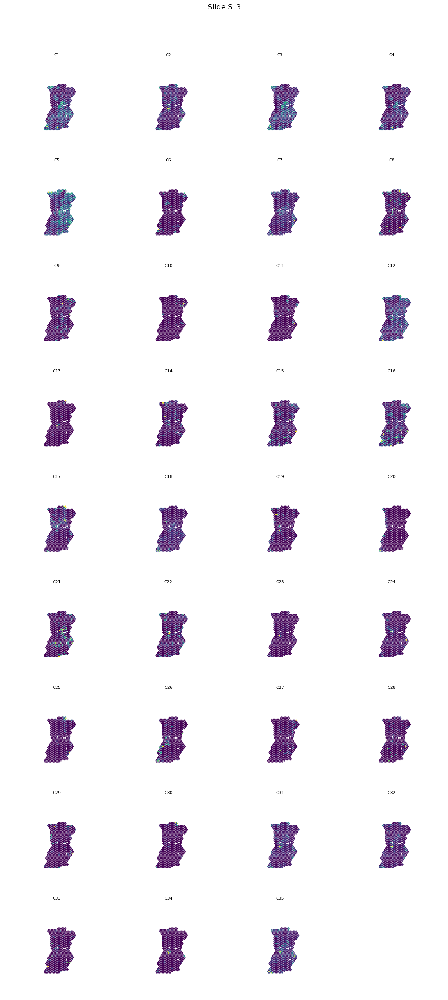

In [4]:
slice_name = "S_3"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_celltype_abundance(slice_name, image, spots, plots_per_line=4)

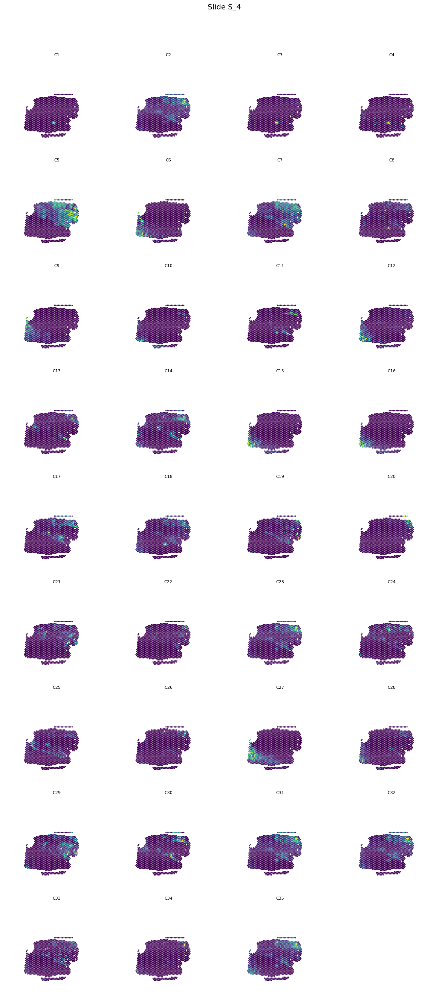

In [5]:
slice_name = "S_4"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_celltype_abundance(slice_name, image, spots, plots_per_line=4)

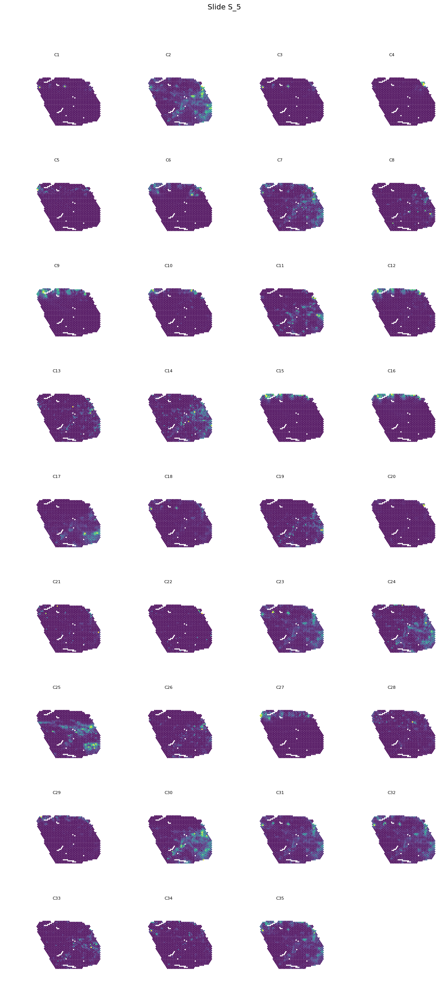

In [6]:
slice_name = "S_5"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_celltype_abundance(slice_name, image, spots, plots_per_line=4)

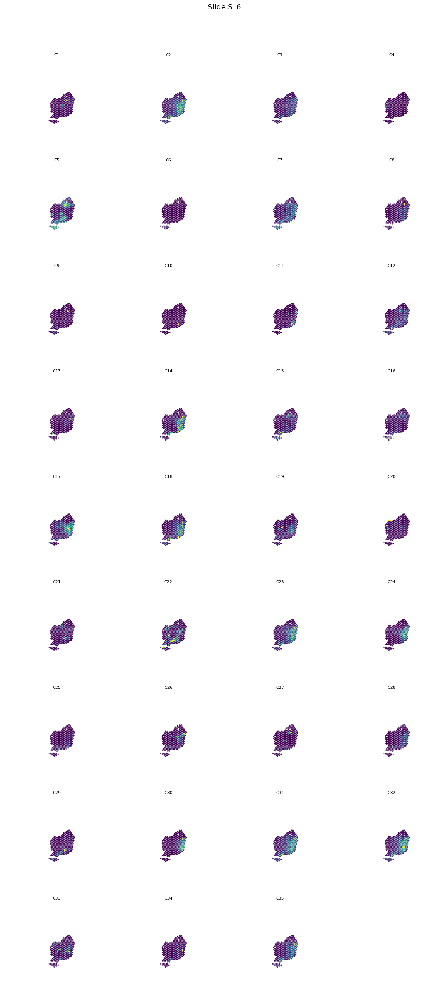

In [7]:
slice_name = "S_6"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_celltype_abundance(slice_name, image, spots, plots_per_line=4)

## PLotting Total Abundance

<ipython-input-1-7a85c0d38eeb>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


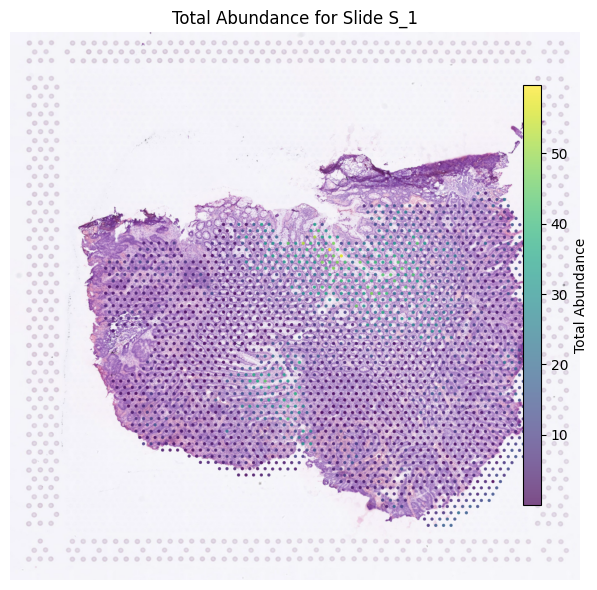

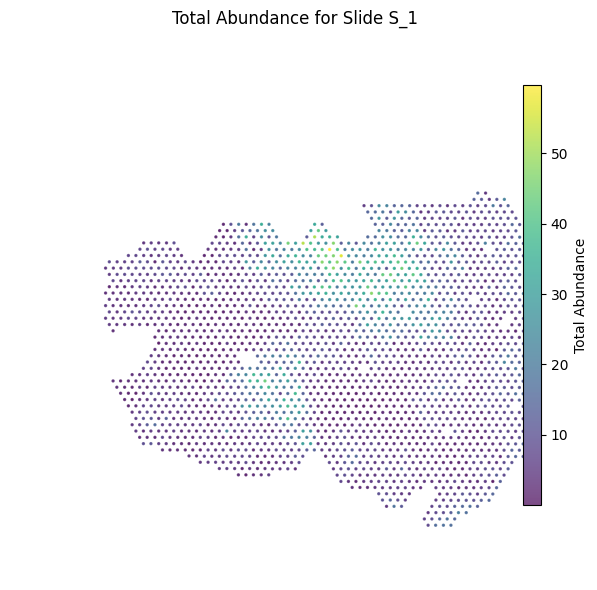

In [8]:
slice_name = "S_1"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True)
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=False)



<ipython-input-1-7a85c0d38eeb>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


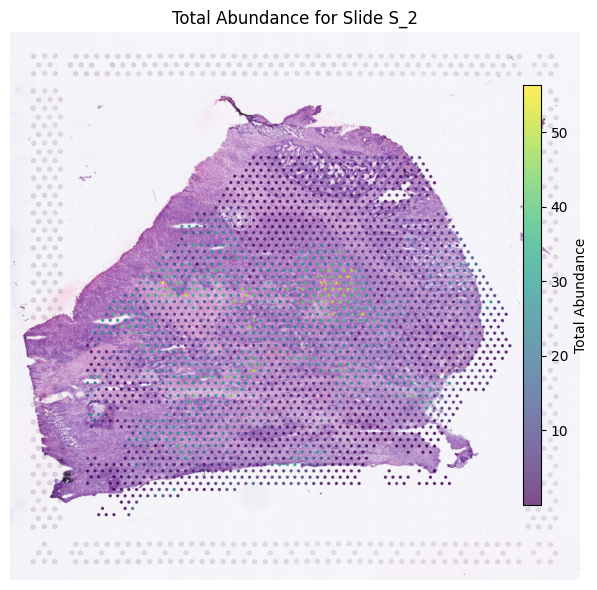

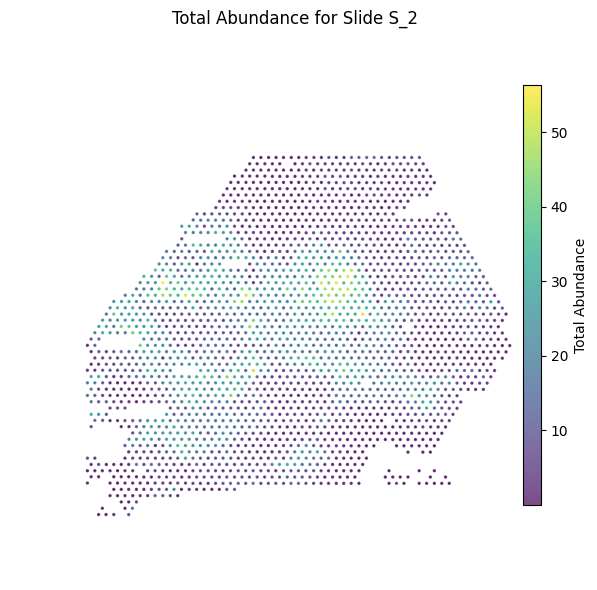

In [9]:
slice_name = "S_2"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True)
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=False)



<ipython-input-1-7a85c0d38eeb>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


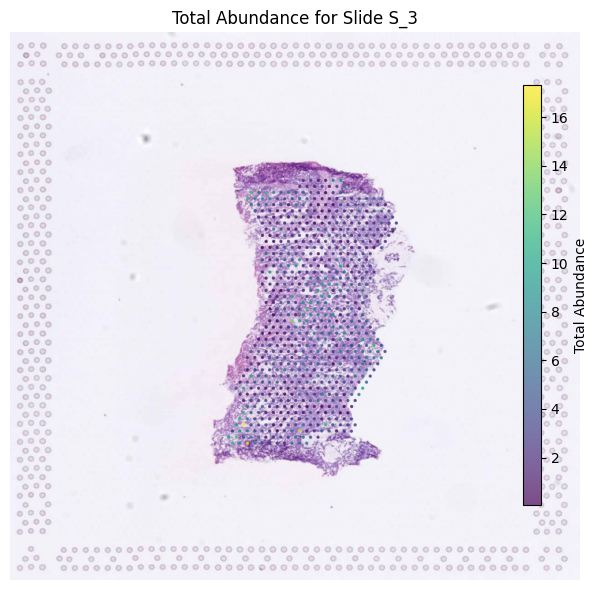

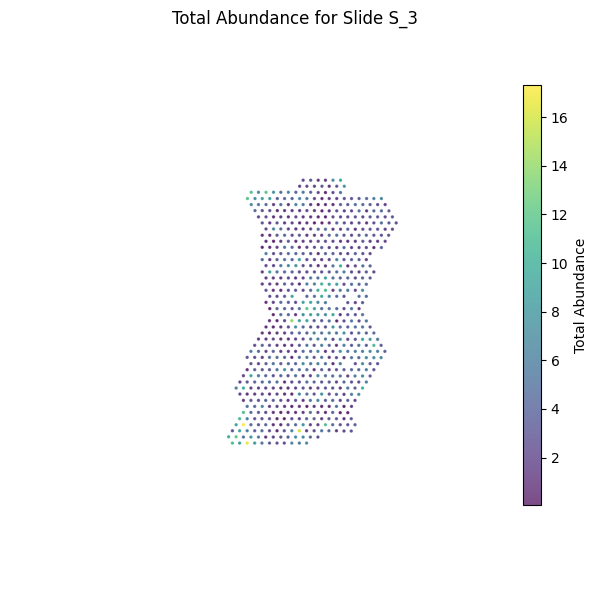

In [10]:
slice_name = "S_3"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True)
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=False)


<ipython-input-1-7a85c0d38eeb>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


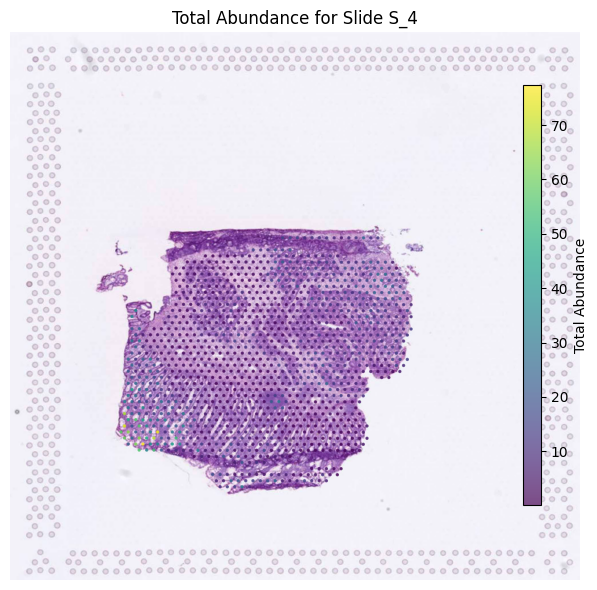

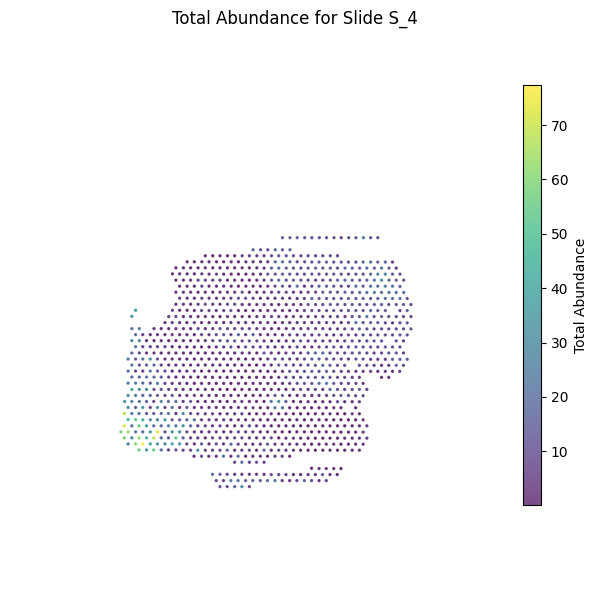

In [11]:
slice_name = "S_4"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True)
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=False)


<ipython-input-1-7a85c0d38eeb>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


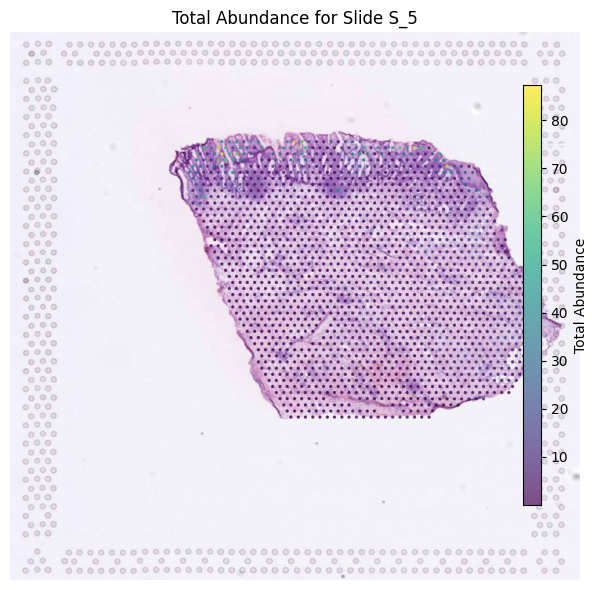

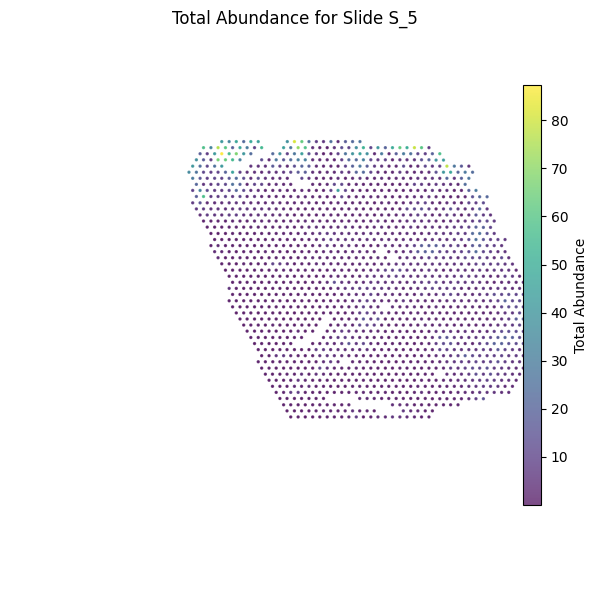

In [12]:
slice_name = "S_5"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True)
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=False)


<ipython-input-1-7a85c0d38eeb>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


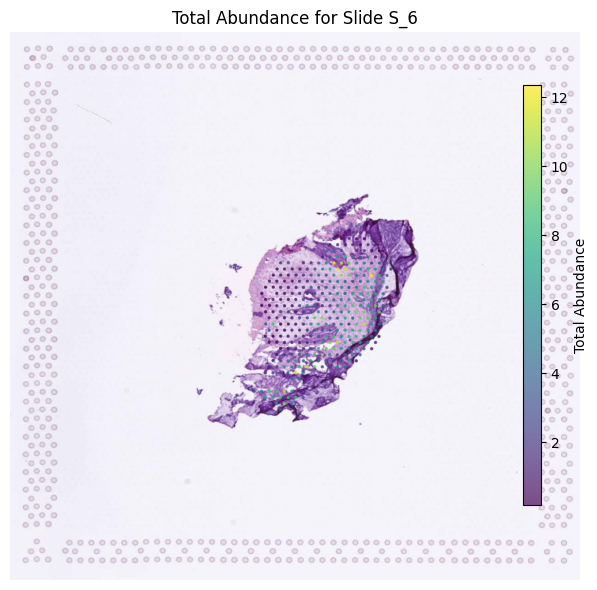

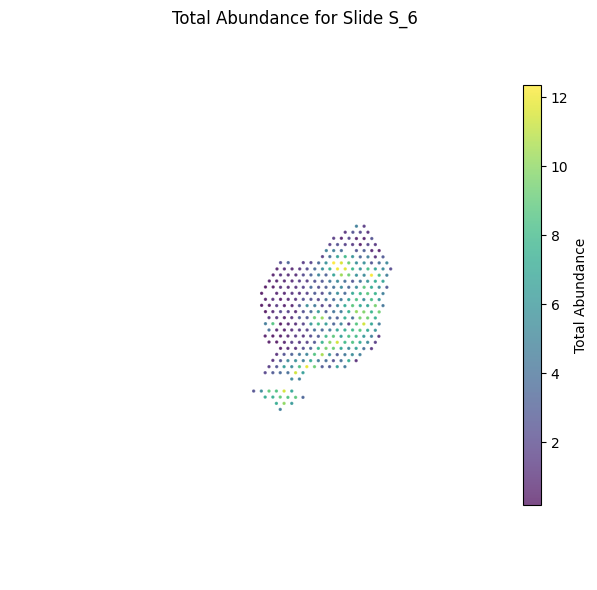

In [13]:
slice_name = "S_6"
with h5py.File("/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5", "r") as h5file:
    image = np.array(h5file["images/Train"][slice_name])
    spots = np.array(h5file["spots/Train"][slice_name])
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True)
    plot_total_abundance(slice_name, image, spots, show_colorbar=True, colorbar_outside=True, show_image=False)
